<a href="https://colab.research.google.com/github/mingyukim-ai/handson/blob/main/KOHI_handson_20221015.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Promedius Inc. \
Mingyu Kim \
mgkim@promedius.ai**

## **실습 주제: DRR을 이용한 응용, CXR bone suppression 연구**

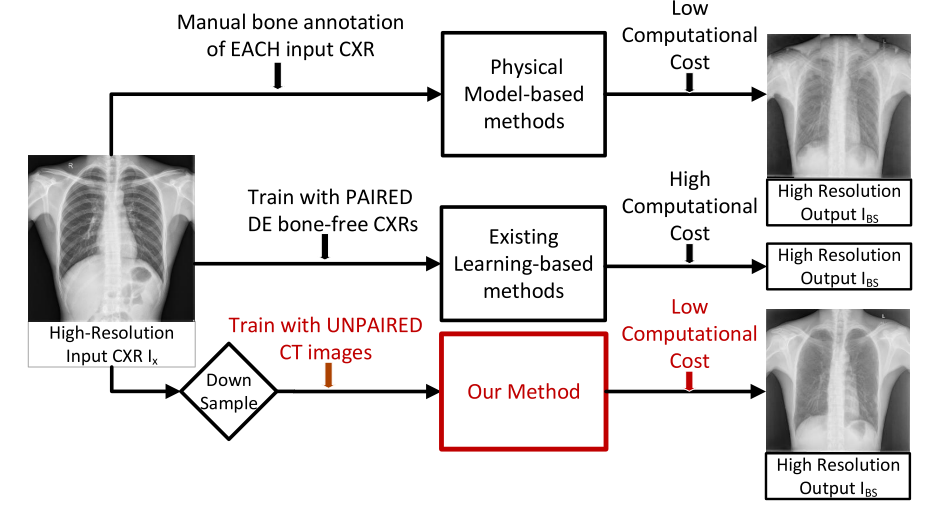

출처: https://pubmed.ncbi.nlm.nih.gov/32275586/

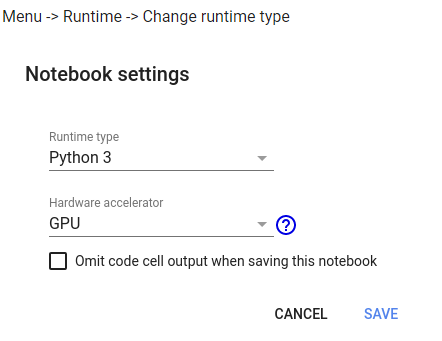

In [ ]:
#할당된 gpu 확인
!nvidia-smi

# 런타임 유형을 GPU로 설정하지 않으면 아래 문구가 뜸
#NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.

Fri Oct 14 03:45:53 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P8    12W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**DRR (Digitally Reconstructed Radiograph)**

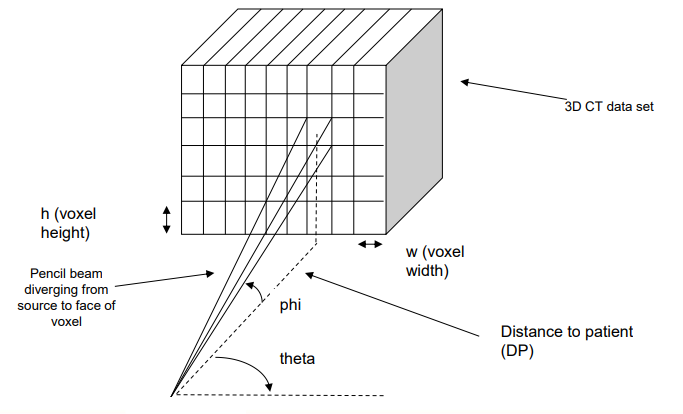

Download the DRR handson software: https://plastimatch.org/

publicly available CT data download site
https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/6ACUZJ

출처: https://bmcresnotes.biomedcentral.com/articles/10.1186/s13104-021-05592-x

In [ ]:
#plastimatch 실습 CT데이터 다운로드
!wget wget --load-cookies ~/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies ~/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb" -O CT_public_data_sample.zip && rm -rf ~/cookies.txt

--2022-10-14 04:08:58--  http://wget/
Resolving wget (wget)... failed: Name or service not known.
wget: unable to resolve host address ‘wget’
--2022-10-14 04:08:58--  https://docs.google.com/uc?export=download&confirm=t&id=1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb
Resolving docs.google.com (docs.google.com)... 74.125.195.139, 74.125.195.100, 74.125.195.138, ...
Connecting to docs.google.com (docs.google.com)|74.125.195.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0c-2o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/snghuckloda95osfifqa2porsea173qr/1665720525000/03948272884470799285/*/1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb?e=download&uuid=e1bc45a2-cd44-4410-82f4-5e4d5846599c [following]
--2022-10-14 04:08:58--  https://doc-0c-2o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/snghuckloda95osfifqa2porsea173qr/1665720525000/03948272884470799285/*/1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb?e=download&uuid=

In [ ]:
#받은 데이터 확인하기
!ls

sample_data


In [ ]:
#데이터 압축풀기
!unzip CT_public_data_sample.zip

In [ ]:
!ls

sample_data


In [ ]:
#폴더내 파일 리스트업
import os
ct_list=os.listdir('CT_public_data_sample')

In [ ]:
print(len(ct_list))

427


In [ ]:
ct_list[:5]

['56364690.dcm',
 '56364659.dcm',
 '56364405.dcm',
 '56364758.dcm',
 '56364613.dcm']

In [ ]:
#다이콤 파일을 읽기 위한 파이썬 라이브러리 불러오기
!pip install pydicom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 10.0 MB/s 


In [ ]:
#다이콤 파일 읽어보기
import pydicom
ds=pydicom.dcmread(os.path.join('CT_public_data_sample', ct_list[0]))

In [ ]:
#다이콤 메타데이터 출력
print(ds)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 210
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.9590.100.1.2.125603019813743103336546766180131193197
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.9590.100.1.3.100.9.4
(0002, 0013) Implementation Version Name         SH: 'MATLAB IPT 9.4'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL', 'HELICAL']
(0008, 0012) Instance Creation Date              DA: '20200311'
(0008, 0013) Instance Creation Time              TM: '113857.546'
(0008, 0016) SOP Class UID                       UI: CT Image 

In [ ]:
ds['SeriesDescription']

(0008, 103e) Series Description                  LO: 'Lung 1.5'

In [ ]:
import tqdm

ct_mediastinum_list=[]
for tmp in tqdm.tqdm(range(len(ct_list))):
  
  ds=pydicom.dcmread(os.path.join('CT_public_data_sample', ct_list[tmp]))
  if 'Mediastinum 1.5' in str(ds['SeriesDescription']):
    ct_mediastinum_list.append(ct_list[tmp])

100%|██████████| 427/427 [00:01<00:00, 398.36it/s]


In [ ]:
print(len(ct_list))
print(len(ct_mediastinum_list))

427
173


In [ ]:
os.makedirs('CT_public_data_sample_mediastinum')

In [ ]:
import shutil
for tmp in tqdm.tqdm(range(len(ct_mediastinum_list))):

  shutil.copy(os.path.join('CT_public_data_sample', ct_mediastinum_list[tmp]), 'CT_public_data_sample_mediastinum')

100%|██████████| 173/173 [00:00<00:00, 1312.43it/s]


In [ ]:
#데이터 압축
!zip -r CT_public_data_sample_mediastinum.zip CT_public_data_sample_mediastinum

In [ ]:
!ls

sample_data


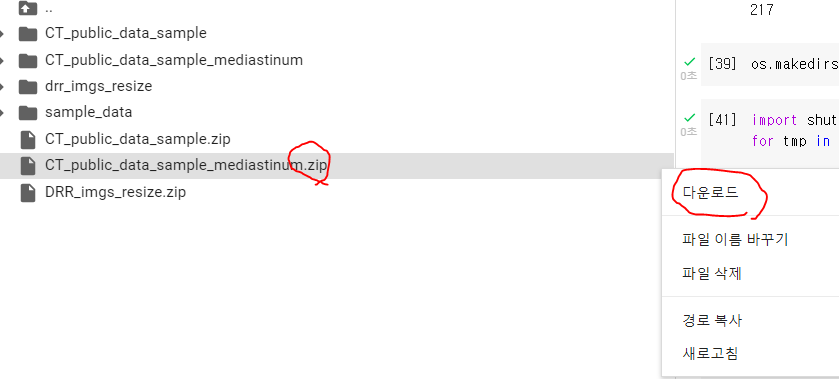

##### 로컬 컴퓨터에서, 크롬으로 아래 사이트에 접속하여 데이터를 다운(위에 방식으로는 다운로드 시간이 많이 소요됨)

https://drive.google.com/file/d/10NEb4d8pOXvxCuh_gWnkLveQWMe0qjgC/view?usp=sharing

##### 로컬 컴퓨터에 다운로드 폴더에서 다운받은 zip파일의 압축 풀기

DRR 프로그램 다운 및 설치
https://sourceforge.net/projects/plastimatch/

DRR 프로그램 메인 홈페이지
http://plastimatch.org/

##### 윈도우 검색에서 plastimatch command prompt를 검색하여 실행

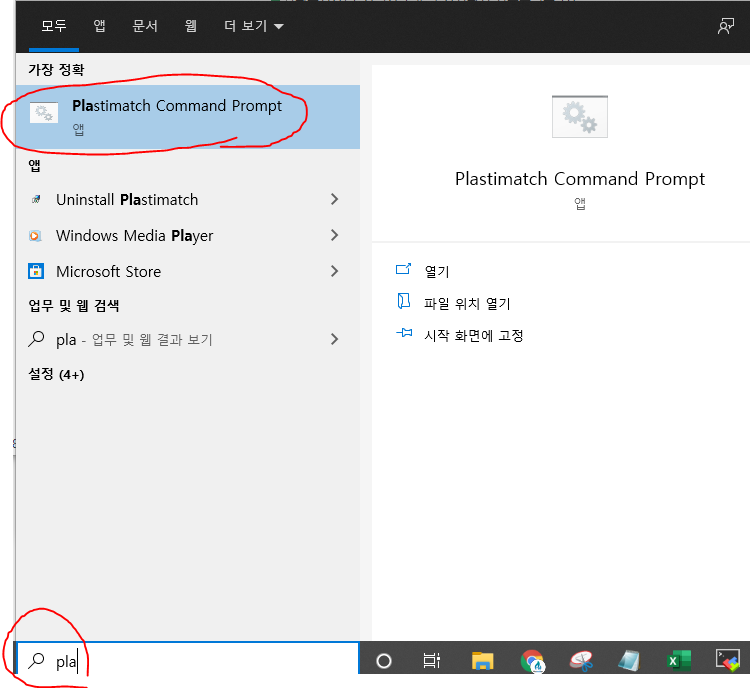

##### 실행화면

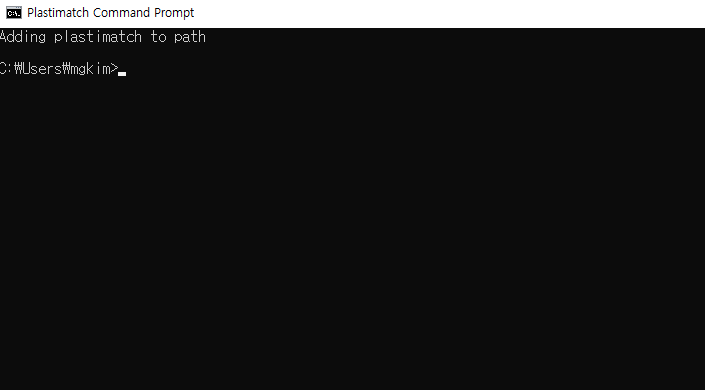

##### 아래 명령어로 Downloads폴더로 이동
cd Downloads

##### 아래 명령어로 Downloads폴더 확인
dir

아래 캡쳐 화면과 같이 실행.\
plastimatch convert --input CT_public_data_sample_mediastinum --output-img convert_CT.mha

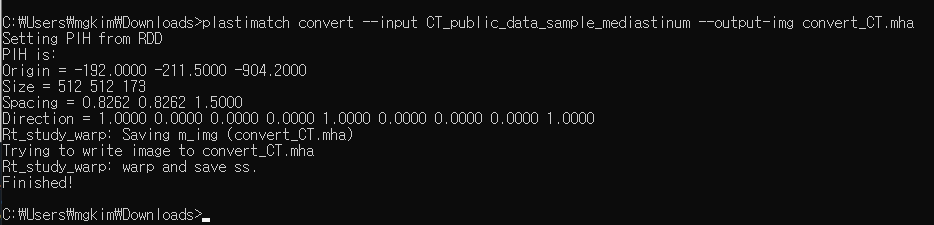

##### 아래 캡쳐 화면과 같이 실행.\
plastimatch drr -t pfm -a 4 -N 90 -r "1024 1024" -o "0.0 -105 -750.0" -z "800 800" -I convert_CT.mha -O convert_CT_pfm/

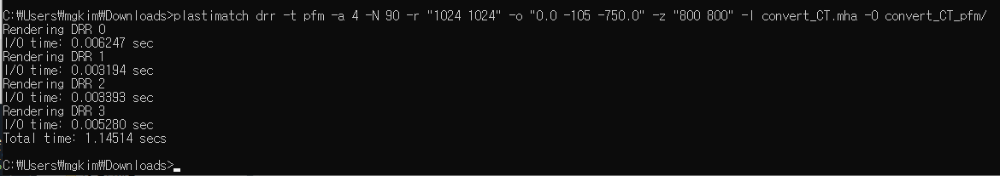

##### 로컬 컴퓨터 download폴더내에 convert_CT_pfm폴더를 zip파일로 압축

##### colab에서 업로드 버튼을 눌러서 로컬 컴퓨터 download폴더내에 convert_CT_pfm.zip폴더를 업로드

In [ ]:
!unzip convert_CT_pfm.zip

Archive:  convert_CT_pfm.zip
   creating: convert_CT_pfm/
  inflating: convert_CT_pfm/0000.pfm  
  inflating: convert_CT_pfm/0000.txt  
  inflating: convert_CT_pfm/0001.pfm  
  inflating: convert_CT_pfm/0001.txt  
  inflating: convert_CT_pfm/0002.pfm  
  inflating: convert_CT_pfm/0002.txt  
  inflating: convert_CT_pfm/0003.pfm  
  inflating: convert_CT_pfm/0003.txt  


In [ ]:
import cv2
import numpy as np

filename=os.path.join('convert_CT_pfm', '0001.pfm')

fid = open(filename, "rb")
raw_data = fid.readlines()
fid.close()

cols=1024
rows=1024

del raw_data[2]
del raw_data[1]
del raw_data[0]

image = np.fromstring(b"".join(raw_data), dtype=np.float32)

del raw_data
image = image.reshape(cols, rows).T
h, w = image.shape

rot_deg = -90
zoom_scale = 1
rot_M = cv2.getRotationMatrix2D((w/2,h/2), rot_deg, zoom_scale)
image_rotated = cv2.warpAffine(image, rot_M, (w, h))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


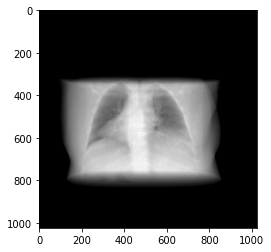

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(image_rotated, cmap='gray')
plt.show()

**3D segmentation handson using ITK snap**

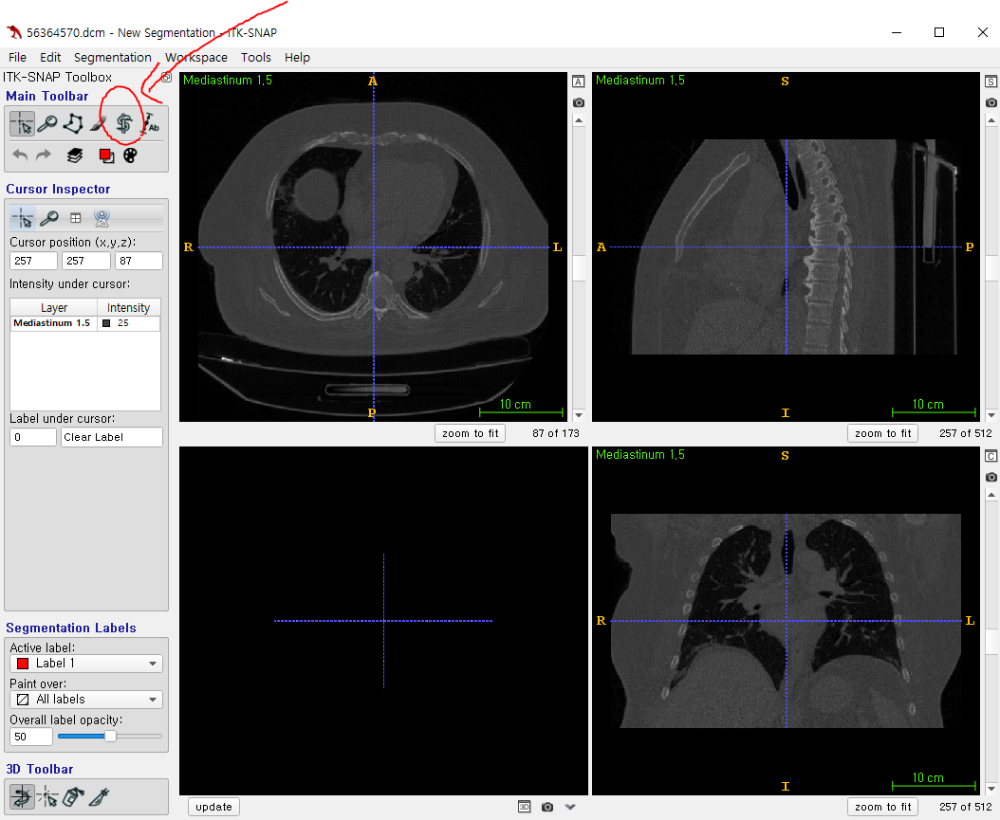

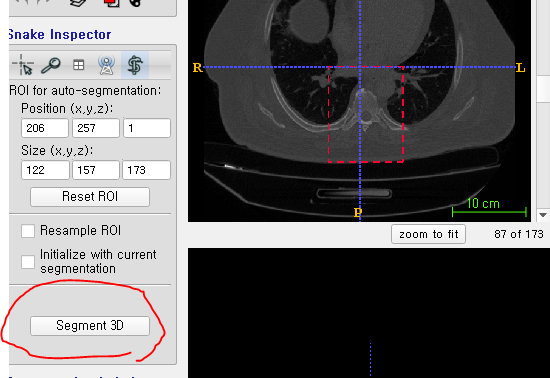

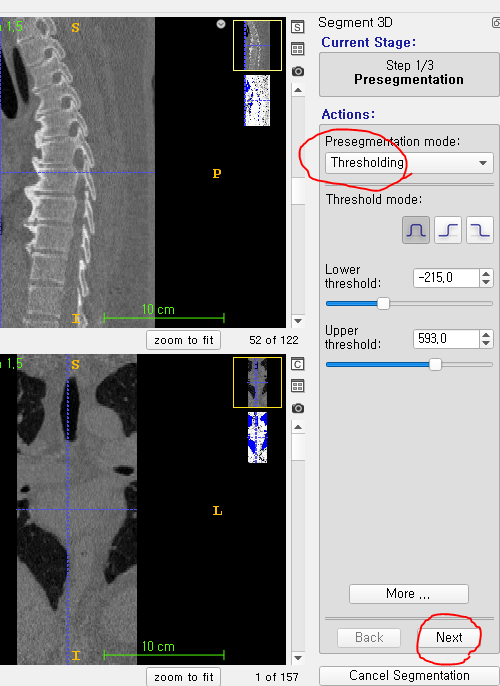

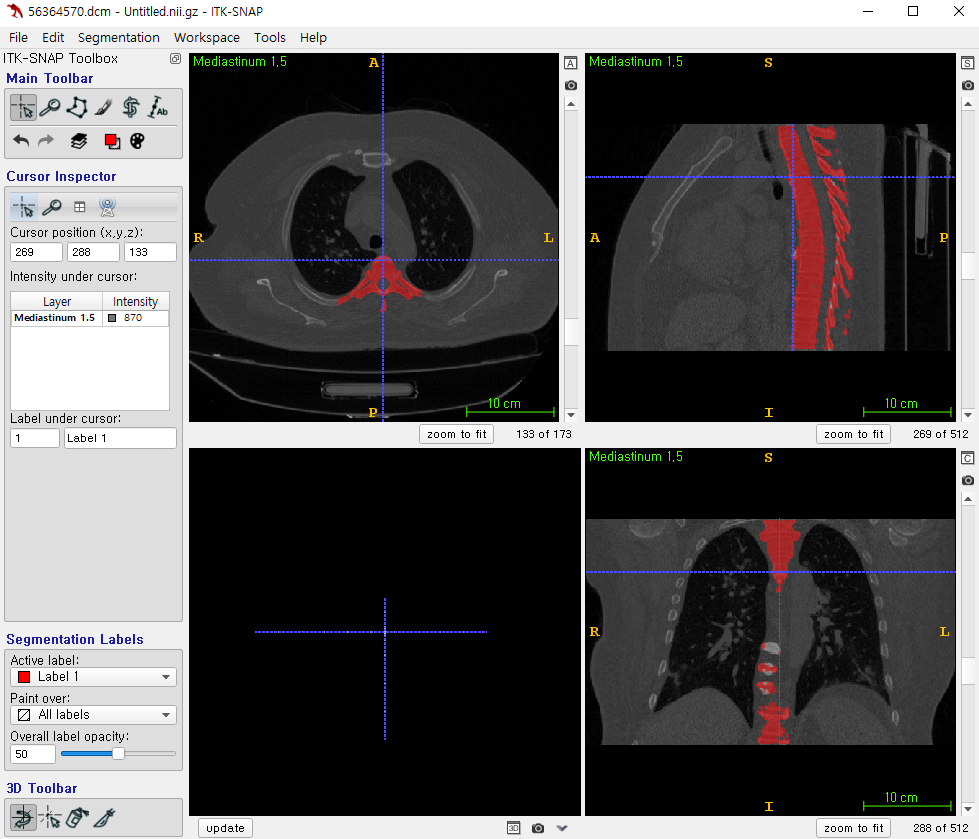

**Promedius labeling tool**

https://labler-brush.vercel.app/viewer

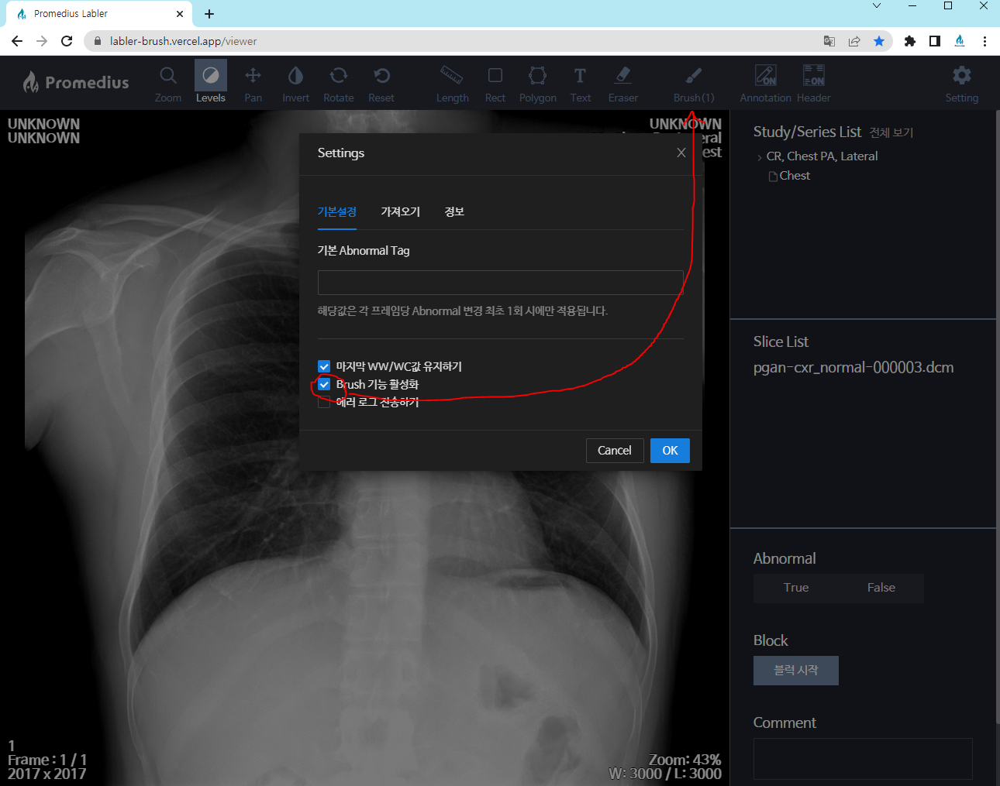

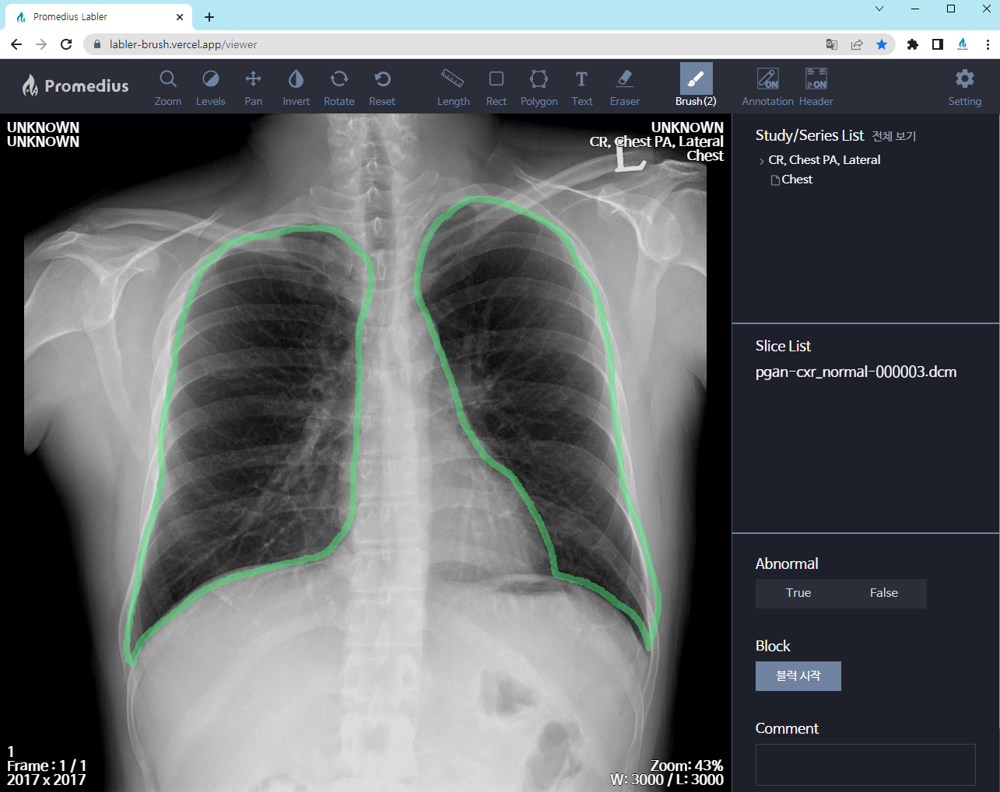

**Bone suppression handson using CycleGAN**

##### pix2pix(왼쪽)와 CycleGAN(오른쪽) 비교
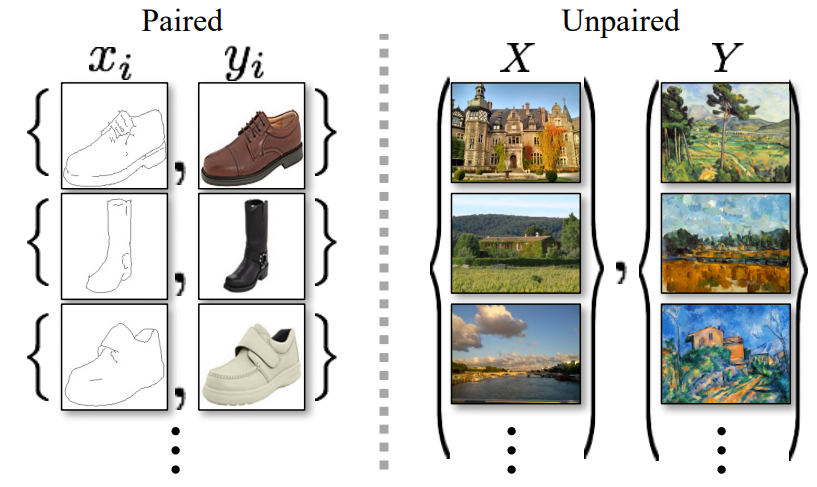

In [ ]:
#핸즈온에 필요한 데이터 가져오기
!wget wget --load-cookies ~/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies ~/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1wXwno7C0SIPrOd1Fd6BAyyVUd4WUZAoR' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1wXwno7C0SIPrOd1Fd6BAyyVUd4WUZAoR" -O DRR_imgs_resize.zip && rm -rf ~/cookies.txt

--2022-10-14 04:26:13--  http://wget/
Resolving wget (wget)... failed: Name or service not known.
wget: unable to resolve host address ‘wget’
--2022-10-14 04:26:13--  https://docs.google.com/uc?export=download&confirm=t&id=1wXwno7C0SIPrOd1Fd6BAyyVUd4WUZAoR
Resolving docs.google.com (docs.google.com)... 74.125.195.138, 74.125.195.100, 74.125.195.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.195.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-2o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ccjue2sl1hrq9ftndbi5uoppnfmla8ec/1665721500000/03948272884470799285/*/1wXwno7C0SIPrOd1Fd6BAyyVUd4WUZAoR?e=download&uuid=63dc0012-be07-4317-aa44-1a75fa6227bf [following]
--2022-10-14 04:26:13--  https://doc-0g-2o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ccjue2sl1hrq9ftndbi5uoppnfmla8ec/1665721500000/03948272884470799285/*/1wXwno7C0SIPrOd1Fd6BAyyVUd4WUZAoR?e=download&uuid=

In [ ]:
#받은 데이터 확인하기
!ls

 convert_CT_pfm
 convert_CT_pfm.zip
 CT_public_data_sample
 CT_public_data_sample_mediastinum
 CT_public_data_sample_mediastinum.zip
 CT_public_data_sample.zip
'CT_public_data_sample.zip?dl=0'
 DRR_imgs_resize.zip
'open?id=1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb'
 sample_data
'uc?id=1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb'
'view?usp=sharing'
 yW6GtGwQb8ZgQcq


In [ ]:
#데이터 압축풀기
!unzip DRR_imgs_resize.zip

In [ ]:
#압축이 잘 풀렸는지 확인
!ls

 convert_CT_pfm
 convert_CT_pfm.zip
 CT_public_data_sample
 CT_public_data_sample_mediastinum
 CT_public_data_sample_mediastinum.zip
 CT_public_data_sample.zip
'CT_public_data_sample.zip?dl=0'
 drr_imgs_resize
 DRR_imgs_resize.zip
'open?id=1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb'
 sample_data
'uc?id=1BVbyrKcwS3Bsttr-hpmsUU6NlhavInFb'
'view?usp=sharing'
 yW6GtGwQb8ZgQcq


In [ ]:
!ls drr_imgs_resize

cxr  cxr_bone  cxr_tissue


In [ ]:
import os
cxr_img_list=os.listdir(os.path.join('drr_imgs_resize', 'cxr'))
cxr_bone_img_list=os.listdir(os.path.join('drr_imgs_resize', 'cxr_bone'))
cxr_tissue_img_list=os.listdir(os.path.join('drr_imgs_resize', 'cxr_tissue'))

In [ ]:
print(len(cxr_img_list))
print(len(cxr_bone_img_list))
print(len(cxr_tissue_img_list))

193
193
193


In [ ]:
print(cxr_img_list[0])
print(cxr_bone_img_list[0])
print(cxr_tissue_img_list[0])

LIDC-IDRI-0434.01-01-2000-CHEST-46567.32113-Recon 2 ACRIN LARGE-45498.png
LIDC-IDRI-0434.01-01-2000-CHEST-46567.32113-Recon 2 ACRIN LARGE-45498.png
LIDC-IDRI-0434.01-01-2000-CHEST-46567.32113-Recon 2 ACRIN LARGE-45498.png


(256, 256)
(256, 256)
(256, 256)


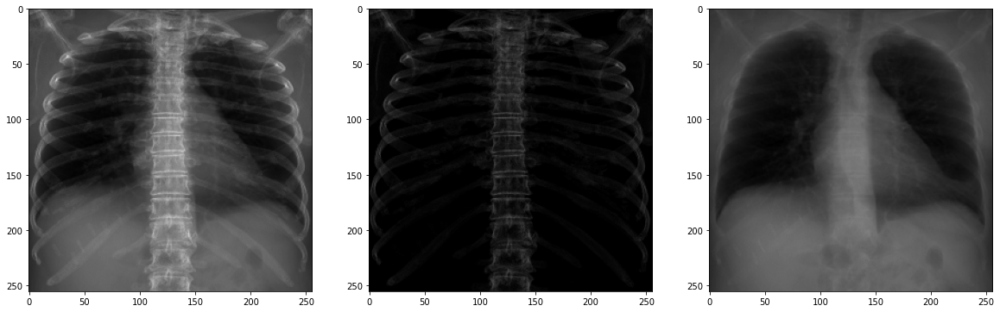

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

inum = np.random.randint(len(cxr_img_list))

cxr_img_sample=cv2.imread(os.path.join('drr_imgs_resize', 'cxr', cxr_img_list[inum]), 0)
cxr_bone_img_sample=cv2.imread(os.path.join('drr_imgs_resize', 'cxr_bone', cxr_bone_img_list[inum]), 0)
cxr_tissue_img_sample=cv2.imread(os.path.join('drr_imgs_resize', 'cxr_tissue', cxr_tissue_img_list[inum]), 0)

print(np.shape(cxr_img_sample))
print(np.shape(cxr_bone_img_sample))
print(np.shape(cxr_tissue_img_sample))

plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(cxr_img_sample, cmap='gray', vmin=0, vmax=255)
plt.subplot(132)
plt.imshow(cxr_bone_img_sample, cmap='gray', vmin=0, vmax=255)
plt.subplot(133)
plt.imshow(cxr_tissue_img_sample, cmap='gray', vmin=0, vmax=255)
plt.show()

In [ ]:
import random

random.shuffle(cxr_img_list)
train_n=int(len(cxr_img_list)*0.9)
test_n=len(cxr_img_list)-train_n
print(train_n)
print(test_n)

173
20


In [ ]:
train_list=cxr_img_list[:train_n]
test_list=cxr_img_list[train_n:]
print(len(train_list))
print(len(test_list))

173
20


In [ ]:
os.makedirs(os.path.join('cyclegan_handson_1', 'trainA'))
os.makedirs(os.path.join('cyclegan_handson_1', 'trainB'))
os.makedirs(os.path.join('cyclegan_handson_1', 'testA'))
os.makedirs(os.path.join('cyclegan_handson_1', 'testB'))

In [ ]:
train_A_path=os.path.join('cyclegan_handson_1', 'trainA')
train_B_path=os.path.join('cyclegan_handson_1', 'trainB')
test_A_path=os.path.join('cyclegan_handson_1', 'testA')
test_B_path=os.path.join('cyclegan_handson_1', 'testB')

In [ ]:
import tqdm
import shutil

for tmp in tqdm.tqdm(range(len(train_list))):
    
    shutil.copy(os.path.join('drr_imgs_resize', 'cxr', train_list[tmp]), train_A_path)
    shutil.copy(os.path.join('drr_imgs_resize', 'cxr_tissue', train_list[tmp]), train_B_path)
    
for tmp in tqdm.tqdm(range(len(test_list))):
    
    shutil.copy(os.path.join('drr_imgs_resize', 'cxr', test_list[tmp]), test_A_path)
    shutil.copy(os.path.join('drr_imgs_resize', 'cxr_tissue', test_list[tmp]), test_B_path)

100%|██████████| 20/20 [00:00<00:00, 1318.09it/s]


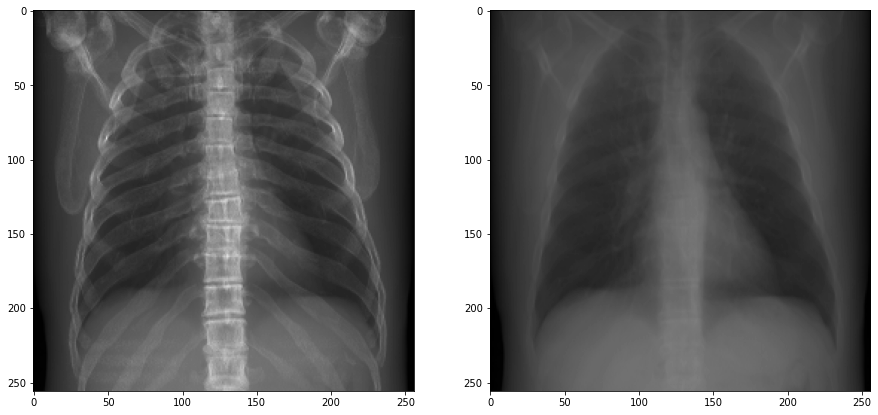

In [ ]:
inum = np.random.randint(len(train_list))

img_A=cv2.imread(os.path.join(train_A_path, train_list[inum]), 0)
img_B=cv2.imread(os.path.join(train_B_path, train_list[inum]), 0)

plt.figure(figsize=(15,10))
plt.subplot(121)
plt.imshow(img_A, cmap='gray', vmin=0, vmax=255)
plt.subplot(122)
plt.imshow(img_B, cmap='gray', vmin=0, vmax=255)
plt.show()

In [ ]:
train_A_list=os.listdir(train_A_path)
train_B_list=os.listdir(train_B_path)
test_A_list=os.listdir(test_A_path)
test_B_list=os.listdir(test_B_path)

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
df=pd.DataFrame()
header_name=['filename','dataset_type']
for tmp in range(len(train_A_list)):
    transfersyntax=[train_A_list[tmp], 'train']
    df_tmp=pd.DataFrame([transfersyntax], columns=header_name)
    df=df.append(df_tmp)
    
for tmp in range(len(test_A_list)):
    transfersyntax=[test_A_list[tmp], 'test']
    df_tmp=pd.DataFrame([transfersyntax], columns=header_name)
    df=df.append(df_tmp)
    
df=df.reset_index(drop=True)

In [ ]:
df

,filename,dataset_type
0,LIDC-IDRI-0434.01-01-2000-CHEST-46567.32113-Re...,train
1,LIDC-IDRI-0328.01-01-2000-CHEST-00758.31206-Re...,train
2,LIDC-IDRI-0609.01-01-2000-42502.30764-97218.png,train
3,LIDC-IDRI-0048.01-01-2000-24306.3000624-03732.png,train
4,LIDC-IDRI-0599.01-01-2000-92393.1996-NLST TLC ...,train
...,...,...
188,LIDC-IDRI-0554.01-01-2000-64555.3000684-01943.png,test
189,LIDC-IDRI-0590.01-01-2000-58320.30726-08002.png,test
190,LIDC-IDRI-0397.01-01-2000-CHEST-76013.31211-Re...,test
191,LIDC-IDRI-0385.01-01-2000-CHEST-52204.30956-Re...,test


In [ ]:
from pandas import ExcelWriter
from pandas import ExcelFile
writer=ExcelWriter('dataset.xlsx')
df.to_excel(writer, 'Sheet1', index=False)
writer.save
writer.close()

**dataset.xlsx를 내pc에 다운로드 받기**

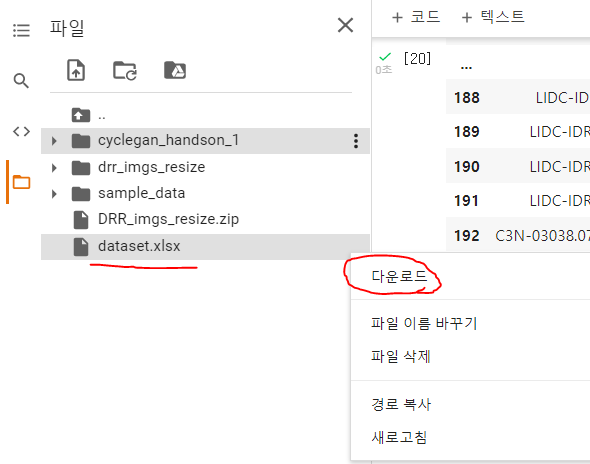

In [ ]:
train_list=df['filename'][df['dataset_type'] == 'train'].to_list()
test_list=df['filename'][df['dataset_type'] == 'test'].to_list()

In [ ]:
test_list

['LIDC-IDRI-0909.01-01-2000-88603.30707-80403.png',
 'LIDC-IDRI-0376.01-01-2000-CHEST-24338.31038-Recon 2 ACRIN LARGE-65837.png',
 'C3N-00309.09-28-1999-TOMOGRAFIA KLATKI PIER-58951.4-Recon 3 Przed kontrastem-72877.png',
 'LIDC-IDRI-0728.01-01-2000-CT THORAX WO IV CONTRA-61238.31463-Recon 2 ACRIN LARGE-15219.png',
 'LIDC-IDRI-0479.01-01-2000-CHEST-13739.30894-Recon 2 ACRIN LARGE-62827.png',
 'LIDC-IDRI-0849.01-01-2000-CHEST-50740.30898-Recon 2 ACRIN LARGE-25236.png',
 'LIDC-IDRI-0525.01-01-2000-26079.2016-NLST TLC VOL B30F-03574.png',
 'LIDC-IDRI-0874.01-01-2000-CHEST-03158.32246-Recon 2-25545.png',
 'LIDC-IDRI-0844.01-01-2000-27134.30825-36332.png',
 'LIDC-IDRI-0545.01-01-2000-CHEST-53172.31181-Recon 2 ACRIN LARGE-46863.png',
 'LIDC-IDRI-0655.01-01-2000-36060.1326-NLST TLC VOL B30F-53512.png',
 'LIDC-IDRI-0997.01-01-2000-96481.1491-NLST TLC VOL B30F-16103.png',
 'LIDC-IDRI-0293.01-01-2000-CHEST-43101.31356-Recon 2 ACRIN SMALL-59979.png',
 'C3N-03764.05-02-2002-KL.P BEZ I Z CE-54793.2-

In [ ]:
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2500, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 2500 (delta 7), reused 12 (delta 4), pack-reused 2478
Receiving objects: 100% (2500/2500), 8.20 MiB | 25.99 MiB/s, done.
Resolving deltas: 100% (1565/1565), done.


In [ ]:
#작업 위치를 코드 아래와 옮기기
import os
os.chdir('./pytorch-CycleGAN-and-pix2pix/')

**requirements.txt파일 열어서 확인해보기**

In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.4 MB 11.1 MB/s 
     |████████████████████████████████| 1.9 MB 44.6 MB/s 
     |████████████████████████████████| 55 kB 3.5 MB/s 
     |████████████████████████████████| 182 kB 65.3 MB/s 
     |████████████████████████████████| 162 kB 60.8 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 
     |████████████████████████████████| 162 kB 72.7 MB/s 
     |████████████████████████████████| 158 kB 73.2 MB/s 
     |████████████████████████████████| 157 kB 75.2 MB/s 
     |████████████████████████████████| 157 kB 75.0 MB/s 
     |████████████████████████████████| 157 kB 75.5 MB/s 
     |████████████████████████████████| 157 kB 73.9 MB/s 
     |████████████████████████████████| 157 kB 76.3 MB/s 
     |████████████████████████████████| 157 kB 54.6 MB/s 
     |████████████████████████████████| 157 kB 71.6 MB/s 
     |█████████████████████████████

In [ ]:
!python train.py --display_id 0 --lr=0.0001 --dataroot ../cyclegan_handson_1/ --name drr_cyclegan_handson_1 --model cycle_gan

----------------- Options ---------------
               batch_size: 1                             
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 256                           
                 dataroot: ../cyclegan_handson_1/        	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
              display_env: main                          
             display_freq: 400                           
               display_id: 0                             	[default: 1]
            display_ncols: 4                             
             display_port: 8097                          
           display_server: http://localhost              
          display_winsize: 256                           
                    epoch: latest                        
 

# 미리 학습해둔 weight를 이용해 추론해보기

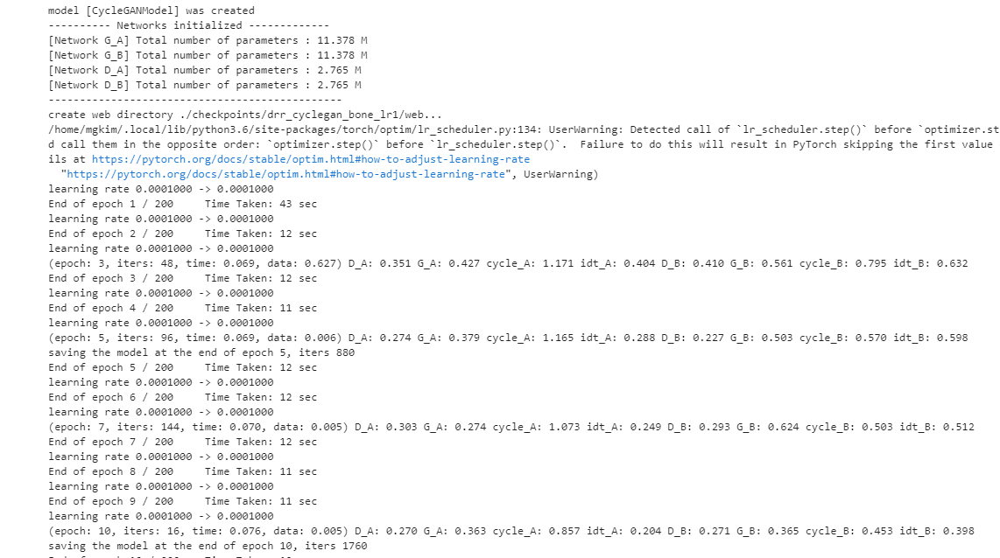


...

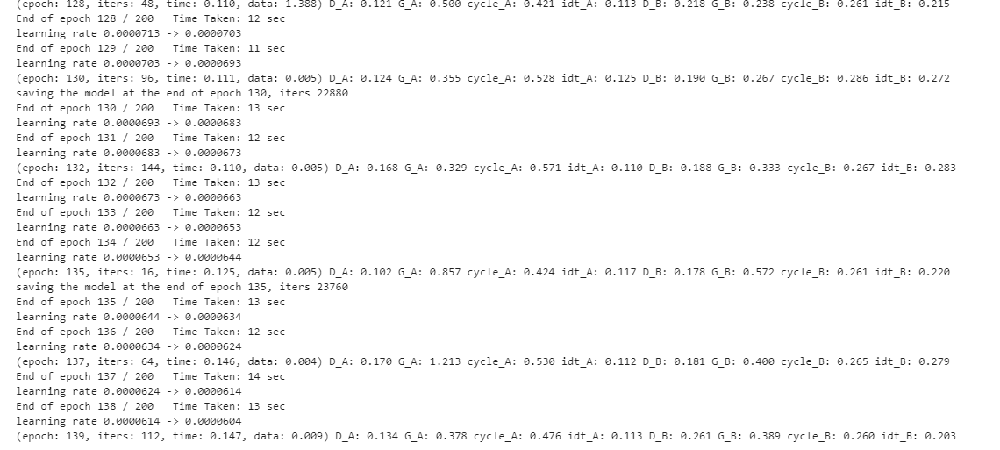

0


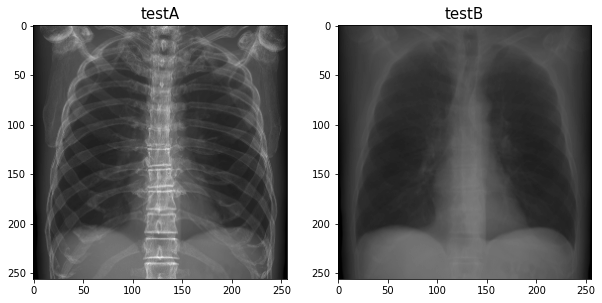

7


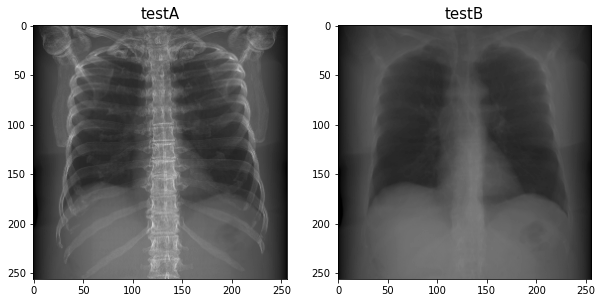

7


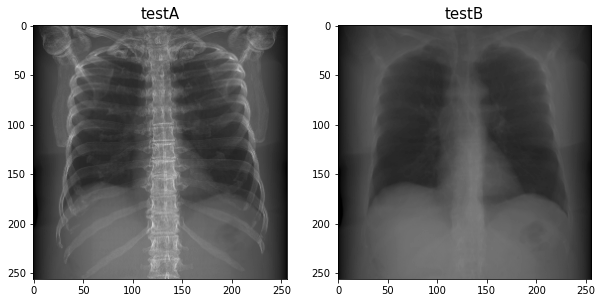

18


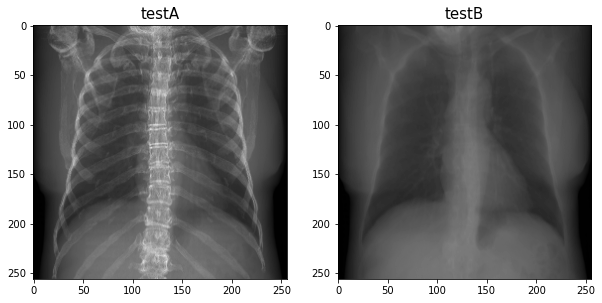

0


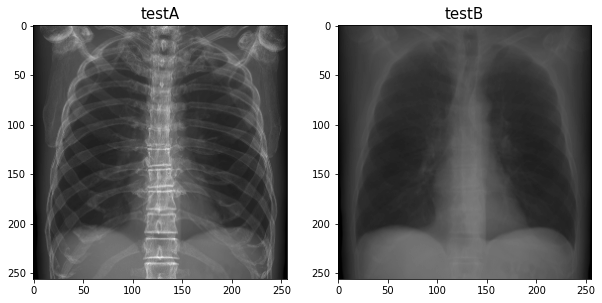

In [ ]:
import cv2
import matplotlib.pyplot as plt

for tmp in range(5):

  inum = np.random.randint(len(test_A_list))
  print(inum)
  testA_img=cv2.imread(os.path.join('../', test_A_path, test_A_list[inum]), 0)
  testB_img=cv2.imread(os.path.join('../', test_B_path, test_A_list[inum]), 0)#파일명을 A와 같이 해서 비교.
  plt.figure(figsize=(10,7))
  plt.subplot(121)
  plt.title('testA', fontsize=15)
  plt.imshow(testA_img, cmap='gray', vmin=0, vmax=255)
  plt.subplot(122)
  plt.title('testB', fontsize=15)
  plt.imshow(testB_img, cmap='gray', vmin=0, vmax=255)
  plt.show()

In [ ]:
#미리 학습해둔 weight받기
!wget wget --load-cookies ~/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies ~/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=12OMcP1txjUOe6cQxpDiHFYCub_jKVnEq' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=12OMcP1txjUOe6cQxpDiHFYCub_jKVnEq" -O latest_net_G_A.pth && rm -rf ~/cookies.txt
os.makedirs(os.path.join('checkpoints', 'drr_cyclegan_handson_1_sample'))
shutil.move('latest_net_G_A.pth', os.path.join('checkpoints', 'drr_cyclegan_handson_1_sample'))
os.rename(os.path.join('checkpoints', 'drr_cyclegan_handson_1_sample', 'latest_net_G_A.pth'), os.path.join('checkpoints', 'drr_cyclegan_handson_1_sample', 'latest_net_G.pth'))

--2022-10-14 04:31:30--  http://wget/
Resolving wget (wget)... failed: Name or service not known.
wget: unable to resolve host address ‘wget’
--2022-10-14 04:31:30--  https://docs.google.com/uc?export=download&confirm=t&id=12OMcP1txjUOe6cQxpDiHFYCub_jKVnEq
Resolving docs.google.com (docs.google.com)... 108.177.98.101, 108.177.98.113, 108.177.98.102, ...
Connecting to docs.google.com (docs.google.com)|108.177.98.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-10-2o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/uhpiu2g95vmv3thpk98upuem23cc9ai6/1665721875000/03948272884470799285/*/12OMcP1txjUOe6cQxpDiHFYCub_jKVnEq?e=download&uuid=715f0f09-fb04-4c3c-9ddd-f9185ae16420 [following]
--2022-10-14 04:31:30--  https://doc-10-2o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/uhpiu2g95vmv3thpk98upuem23cc9ai6/1665721875000/03948272884470799285/*/12OMcP1txjUOe6cQxpDiHFYCub_jKVnEq?e=download&uuid=

In [ ]:
!ls checkpoints/drr_cyclegan_handson_1_sample

latest_net_G.pth


In [ ]:
!python test.py --dataroot ../cyclegan_handson_1/testA --name drr_cyclegan_handson_1_sample --model test --checkpoints_dir 'checkpoints/' --results_dir 'results'  --no_dropout --num_test 20

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: checkpoints/                  	[default: ./checkpoints]
                crop_size: 256                           
                 dataroot: ../cyclegan_handson_1/testA   	[default: None]
             dataset_mode: single                        
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0   

In [ ]:
#이미지 비교 metric 함수(mean squared error와 structural similarity index)
from skimage.metrics import structural_similarity as ssim

def mse(imageA, imageB):
    
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    
    return err
def compare_images(imageA, imageB):
    
    mse_value = mse(imageA, imageB)
    ssim_value = ssim(imageA, imageB)
    
    return mse_value, ssim_value

MSE of paired image 27.55
SSIM of paired image 94.5


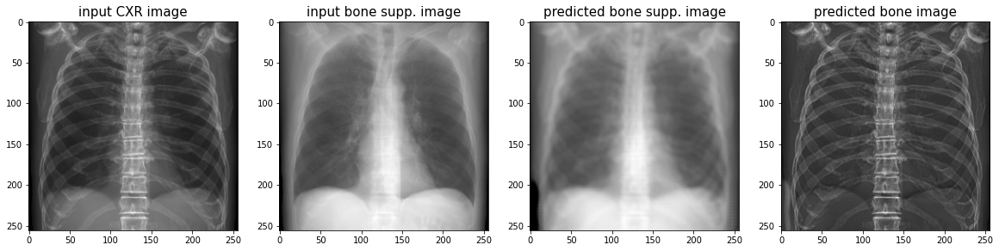

MSE of paired image 35.05
SSIM of paired image 94.47


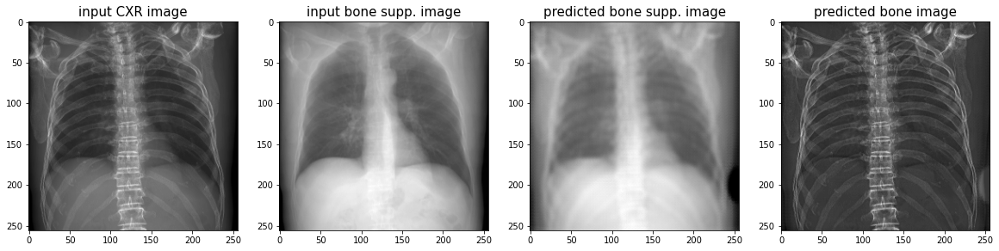

MSE of paired image 22.53
SSIM of paired image 93.0


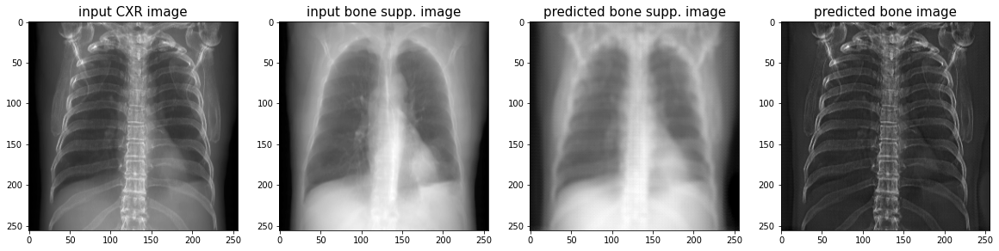

MSE of paired image 83.03
SSIM of paired image 93.99


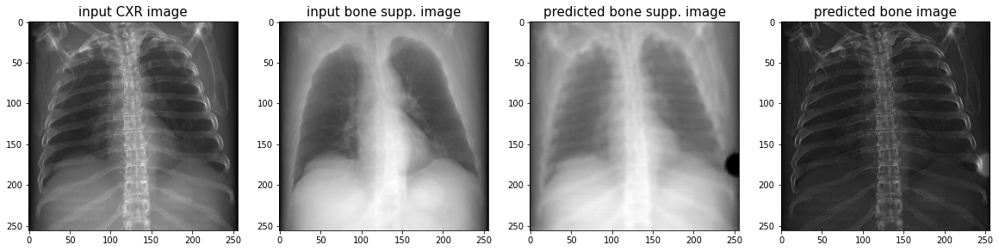

MSE of paired image 103.8
SSIM of paired image 92.89


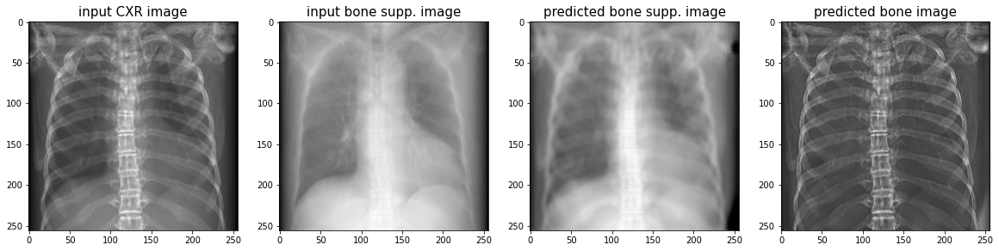

MSE of paired image 56.81
SSIM of paired image 94.06


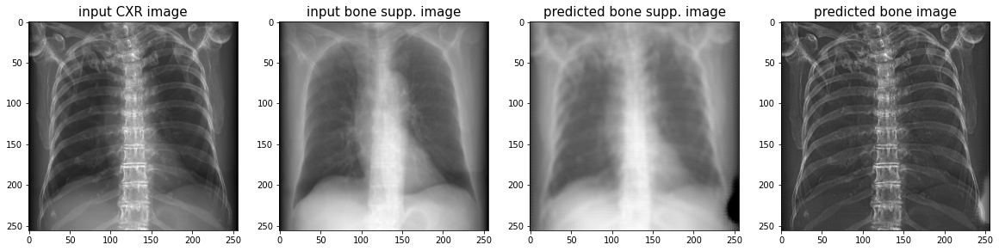

MSE of paired image 31.84
SSIM of paired image 93.4


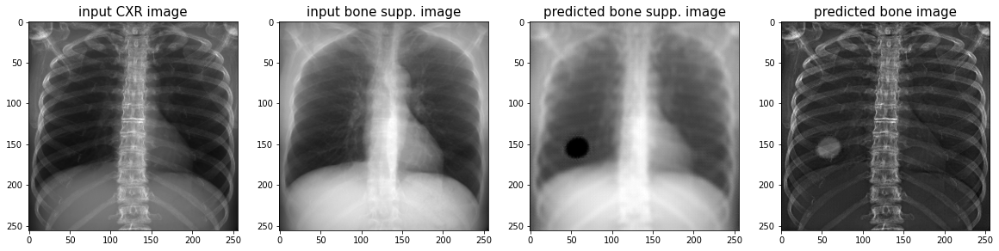

MSE of paired image 34.29
SSIM of paired image 95.12


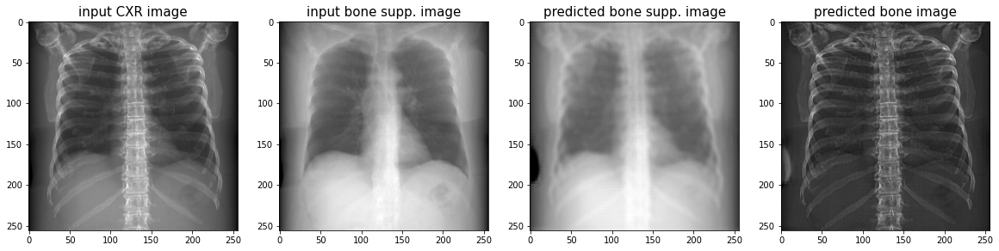

MSE of paired image 21.23
SSIM of paired image 94.62


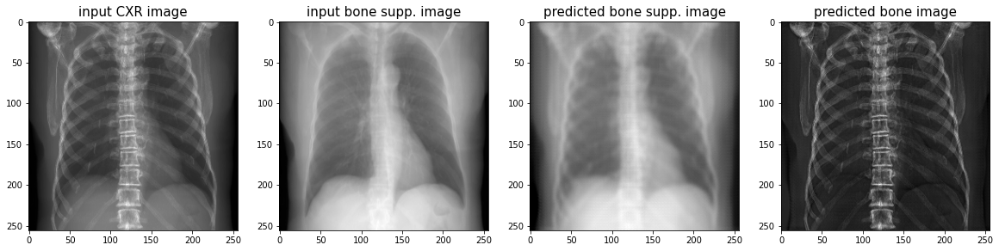

MSE of paired image 39.52
SSIM of paired image 94.54


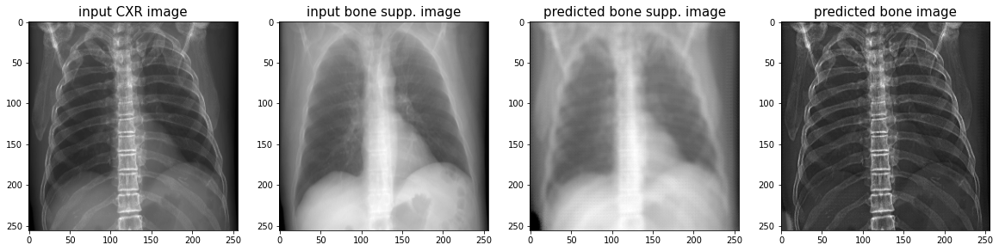

MSE of paired image 28.38
SSIM of paired image 94.24


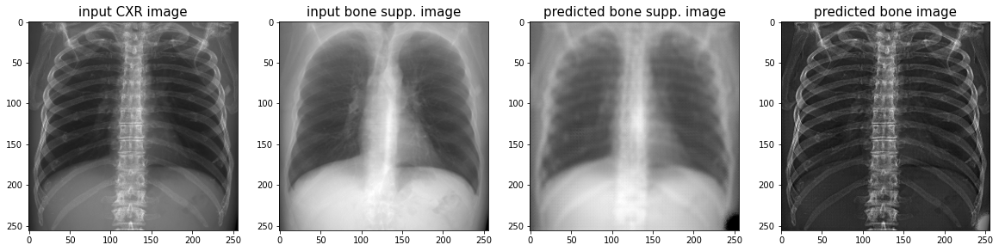

MSE of paired image 41.79
SSIM of paired image 93.4


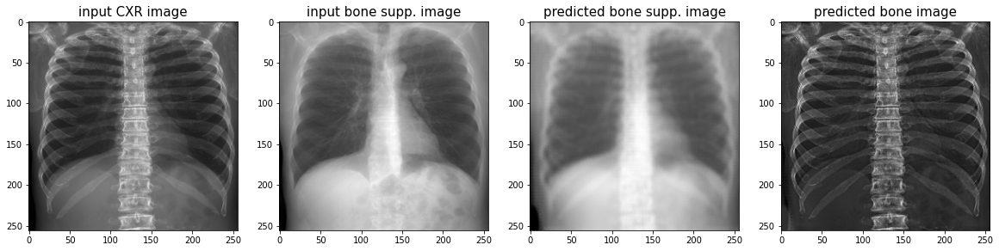

MSE of paired image 32.47
SSIM of paired image 93.91


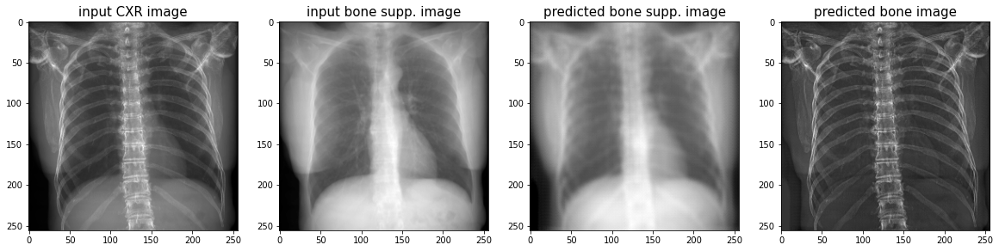

MSE of paired image 23.37
SSIM of paired image 92.92


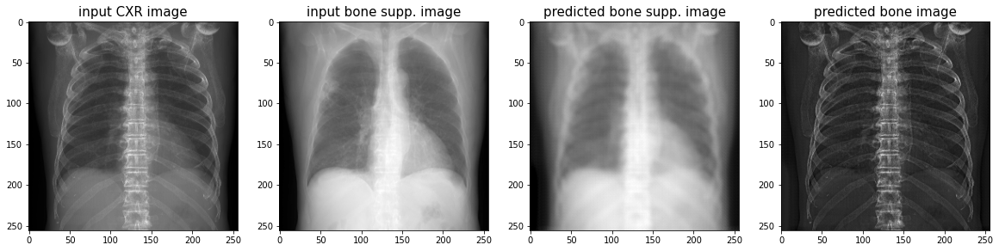

MSE of paired image 25.22
SSIM of paired image 94.2


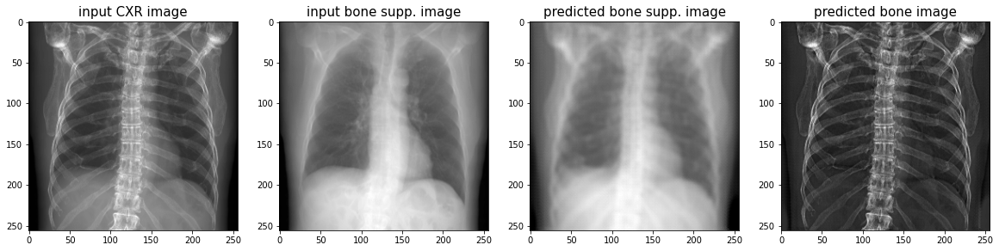

MSE of paired image 73.1
SSIM of paired image 91.66


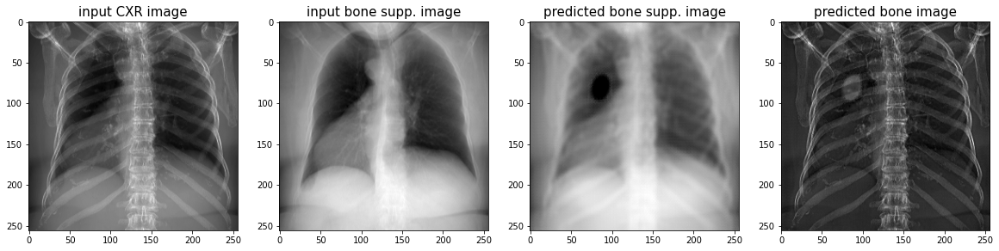

MSE of paired image 31.94
SSIM of paired image 91.27


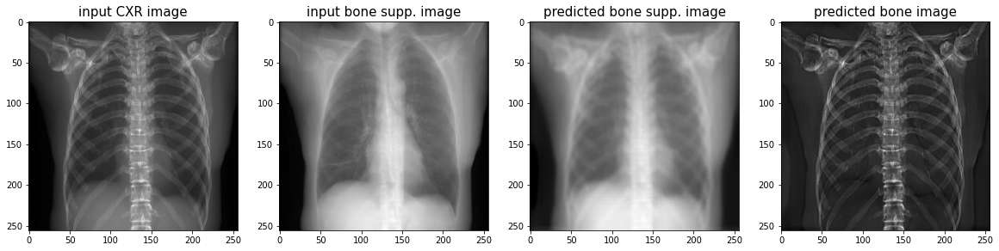

MSE of paired image 39.02
SSIM of paired image 94.9


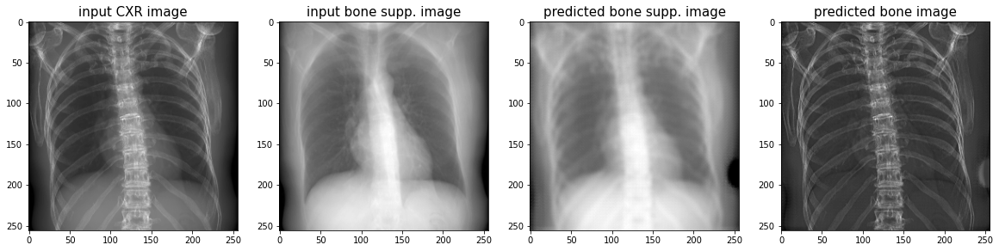

MSE of paired image 27.9
SSIM of paired image 94.09


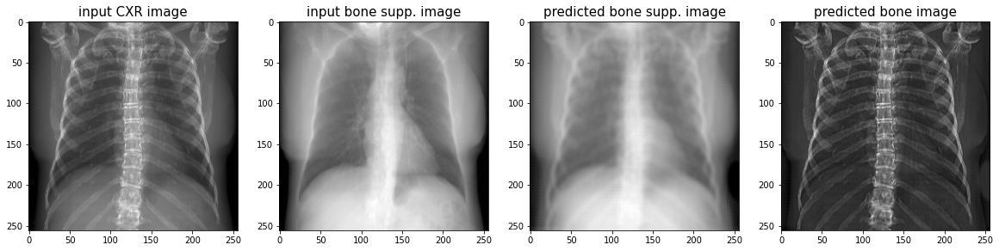

MSE of paired image 41.95
SSIM of paired image 94.9


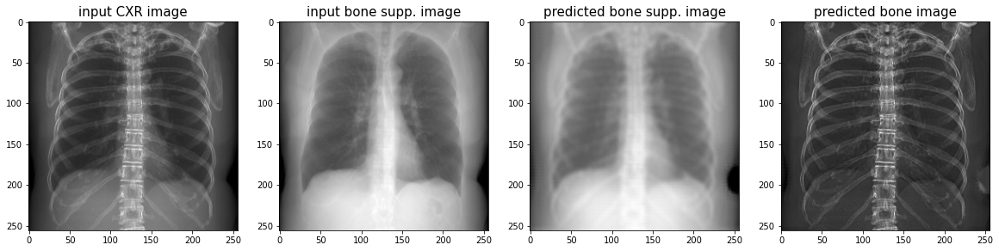

In [ ]:
#테스트 이미지에 대해 MSE와 SSIM구하기
import glob
import numpy as np

testA_images=glob.glob(os.path.join('../', test_A_path, '*.png'))

mse_arr=[]
ssim_arr=[]
for tmp in range(len(testA_images)):
    
    img_testA=cv2.imread(testA_images[tmp], 0)
    img_testB=cv2.imread(testA_images[tmp].replace('testA', 'testB'), 0)
    
    img_testB_translated=cv2.imread(os.path.join('results/drr_cyclegan_handson_1_sample/test_latest/images', testA_images[tmp].split('/')[-1]).replace('.png','_fake.png'), 0)
    
    mse_v, ssim_v = compare_images(img_testB, img_testB_translated)
    
    print('MSE of paired image', round(mse_v, 2))
    print('SSIM of paired image', round((ssim_v*100.), 2))
    
    img_translated_bone=img_testA.astype("float")-img_testB_translated.astype("float")
    
    mse_arr.append(mse_v)
    ssim_arr.append(ssim_v)
    
    plt.figure(figsize=(20,10))
    plt.subplot(141)
    plt.title('input CXR image', fontsize=15)
    plt.imshow(img_testA, cmap='gray')
    plt.subplot(142)
    plt.title('input bone supp. image', fontsize=15)
    plt.imshow(img_testB, cmap='gray')
    plt.subplot(143)
    plt.title('predicted bone supp. image', fontsize=15)
    plt.imshow(img_testB_translated, cmap='gray')
    plt.subplot(144)
    plt.title('predicted bone image', fontsize=15)
    plt.imshow(img_translated_bone, cmap='gray')
    plt.show()


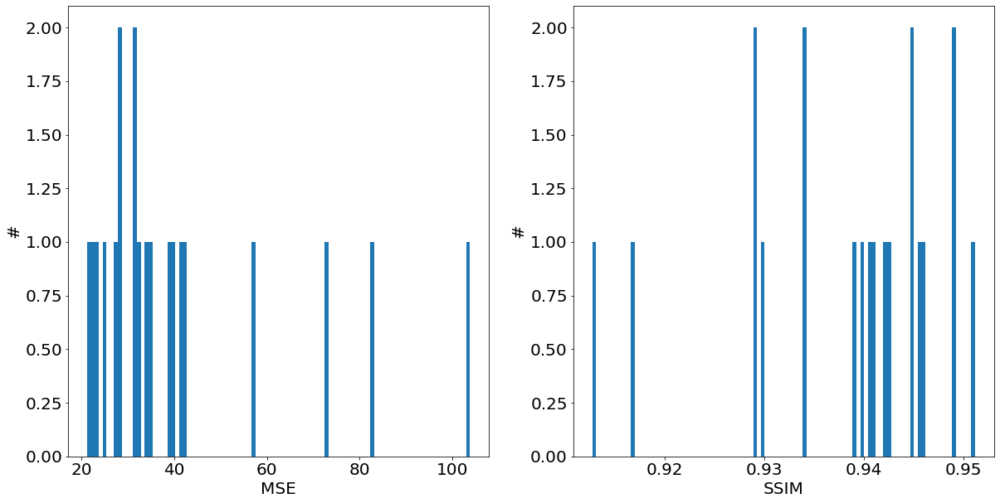

In [ ]:
#이미지 비교 metric MSE와 SSIM히스토그램 그려보기
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.hist(mse_arr, bins=100)
plt.xlabel('MSE', fontsize=20)
plt.ylabel('#', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=20) 
plt.subplot(122)
plt.hist(ssim_arr, bins=100)
plt.xlabel('SSIM', fontsize=20)
plt.ylabel('#', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=20) 
plt.show()

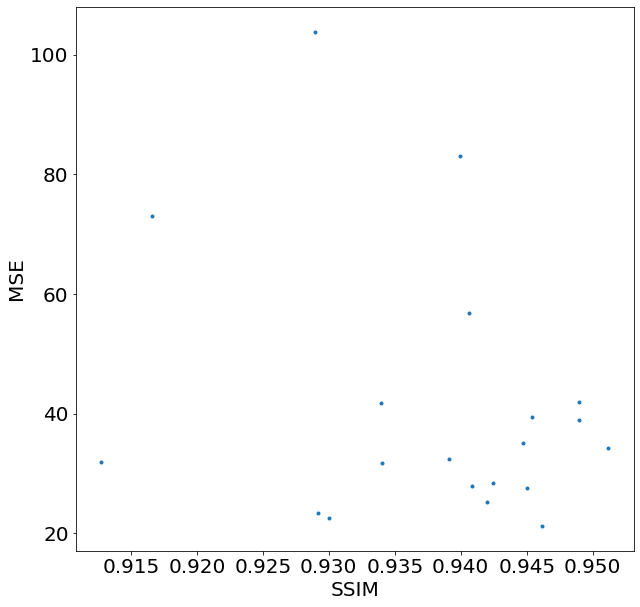

In [ ]:
#이미지 비교 metric MSE와 SSIM상관관계 그려보기
plt.figure(figsize=(10,10))
plt.plot(ssim_arr, mse_arr, '.')
plt.xlabel('SSIM', fontsize=20)
plt.ylabel('MSE', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.show()